In [16]:
import pandas as pd
import matplotlib.pyplot as plt

In [17]:
data = pd.read_json('out/data/5255_toxins.json')
data.fillna('0', inplace=True)
data

,Entry,Entry Name,Protein names,Gene Names,Organism,Domain [FT],Protein families,Sequence similarities,Sequence,X,Y,cluster_labels,Pfam,Gene3D
0,A0A0B4U9L8,VMF1_VIPAA,Zinc metalloproteinase-disintegrin-like protei...,0,Vipera ammodytes ammodytes (Western sand viper),"DOMAIN 202..398; /note=""Peptidase M12B""; /evid...","Venom metalloproteinase (M12B) family, P-III s...",SIMILARITY: Belongs to the venom metalloprotei...,MLQVLLVTICLAVFPYQGSSIILESGNVNDYEVVYPQKLTALLKGA...,0.215006,0.719284,0,PF08516;PF00200;PF01562;PF01421;,3.40.390.10;4.10.70.10;
1,A0A0B5A8P4,INS3A_CONGE,Con-Ins G3 (Insulin 3) [Cleaved into: Con-Ins ...,0,Conus geographus (Geography cone) (Nubecula ge...,0,Insulin family,SIMILARITY: Belongs to the insulin family.,MTTSFYFLLVALGLLLYVCQSSFGNQHTRNSDTPKHRCGSELADQY...,0.471781,0.804368,1,PF00049;,1.10.100.10;
2,A0A0B5AC95,INS1A_CONGE,Con-Ins G1a (Insulin 1) [Cleaved into: Con-Ins...,0,Conus geographus (Geography cone) (Nubecula ge...,0,Insulin family,SIMILARITY: Belongs to the insulin family. {EC...,MTTSSYFLLMALGLLLYVCQSSFGNQHTRTFDTPKHRCGSEITNSY...,0.471446,0.809471,1,PF00049;,1.10.100.10;
3,A0A0D4WV12,BIB11_SICTE,Dermonecrotic toxin StSicTox-betaIB1i (EC 4.6....,0,Sicarius terrosus (Cave spider),0,"Arthropod phospholipase D family, Class II sub...",SIMILARITY: Belongs to the arthropod phospholi...,GDSRRPIWNIAHMVNDLDLVDEYLDDGANSLELDVEFSKSGTALRT...,0.082629,0.644929,2,PF13653;,3.20.20.190;
4,A0A0N7CSQ4,TX41A_SCOMU,Tau-scoloptoxin(04)-Sm1b (Tau-SLPTX(04)-Sm1b) ...,0,Scolopendra mutilans (Chinese red-headed centi...,0,Scoloptoxin-04 family,SIMILARITY: Belongs to the scoloptoxin-04 fami...,MLKSFCILSVFMVLFLAKFPDLCSGEEISPLKIVVRNSEYLNNPCN...,0.123150,0.701138,-1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5250,P0CI16,TE61_HASHE,Augerpeptide hhe6.1,0,Hastula hectica (Sea snail) (Impages hectica),0,0,0,GMGIGINLPPCIKNGEYCNPWTGSIILGGACCGTCTDYECH,0.945380,0.453934,-1,0,0
5251,P0CI17,TE62_HASHE,Augerpeptide hhe6.2,0,Hastula hectica (Sea snail) (Impages hectica),0,0,0,ALPCPYGCPLRCCHMTDGVCLRNKQGC,0.422708,0.038988,-1,0,0
5252,P0CI18,TE63_HASHE,Augerpeptide hhe6.3,0,Hastula hectica (Sea snail) (Impages hectica),0,0,0,VLFTPPELLGCGNRCSDDCCKWGRCQPGCTD,0.003607,0.602928,-1,0,0
5253,P0CI19,TE64_HASHE,Augerpeptide hhe6.4,0,Hastula hectica (Sea snail) (Impages hectica),0,0,0,SSLHCGDDPWCPTGCCENEDCDIGCKRDWEKSRSQP,0.048968,0.425110,-1,0,0


In [18]:
grouped = data.groupby('cluster_labels').agg({
    'Protein families': lambda x: [item.strip() for item in x if item.strip()],
    'Pfam': lambda x: [item.strip() for sublist in [item.split(';') for item in x] for item in sublist if item.strip()],
    'Gene3D': lambda x: [item.strip() for sublist in [item.split(';') for item in x] for item in sublist if item.strip()]
}).reset_index()
grouped

,cluster_labels,Protein families,Pfam,Gene3D
0,-1,"[Scoloptoxin-04 family, Scoloptoxin-15 family,...","[0, PF01223, PF01663, PF01033, 0, PF07740, PF0...","[0, 4.10.410.20, 3.40.720.10, 3.40.570.10, 0, ..."
1,0,"[Venom metalloproteinase (M12B) family, P-III ...","[PF08516, PF00200, PF01562, PF01421, 0, PF0008...","[3.40.390.10, 4.10.70.10, 1.20.90.10, 2.10.60...."
2,1,"[Insulin family, Insulin family, Insulin famil...","[PF00049, PF00049, PF00059, PF00059, PF00188, ...","[1.10.100.10, 1.10.100.10, 3.10.100.10, 3.10.1..."
3,2,"[Arthropod phospholipase D family, Class II su...","[PF13653, PF13653, PF07740, 0, PF07365, PF0736...","[3.20.20.190, 3.20.20.190, 0, 0, 0, 0, 1.20.90..."
4,3,"[Peptidase S1 family, Snake venom subfamily, P...","[PF00089, PF00008, PF14670, PF00594, PF00089, ...","[2.40.10.10, 4.10.740.10, 2.10.25.10, 2.40.10...."
5,4,"[Phospholipase A2 family, Group II subfamily, ...","[PF00068, PF02950, PF08516, PF00200, PF01562, ...","[1.20.90.10, 0, 3.40.390.10, 4.10.70.10, 1.20...."
6,5,"[Venom Kunitz-type family, Venom Kunitz-type f...","[PF00014, 0, PF00068, PF00068, PF05826, PF0034...","[4.10.410.10, 0, 1.20.90.10, 1.20.90.10, 1.20...."
7,6,"[Conotoxin O1 superfamily, Conotoxin O1 superf...","[PF01593, PF00212, PF00537, PF00537, PF00068, ...","[3.90.660.10, 3.50.50.60, 1.10.405.10, 0, 3.30..."
8,7,"[Neurotoxin 10 (Hwtx-1) family, 14 (Hntx-1) su...","[PF00068, PF00068, PF00068, PF01593, PF00089, ...","[1.20.90.10, 1.20.90.10, 1.20.90.10, 3.90.660...."
9,8,"[Snake three-finger toxin family, Ancestral su...","[PF08516, PF00200, PF01562, 0, PF07740, PF0006...","[4.10.70.10, 2.10.60.10, 0, 1.20.90.10, 1.20.9..."


In [19]:
grouped['Protein families_counts'] = grouped['Protein families'].apply(lambda x: pd.Series(x).value_counts().to_dict())
grouped['Pfam_counts'] = grouped['Pfam'].apply(lambda x: pd.Series(x).value_counts().to_dict())
grouped['Gene3D_counts'] = grouped['Gene3D'].apply(lambda x: pd.Series(x).value_counts().to_dict())
grouped

,cluster_labels,Protein families,Pfam,Gene3D,Protein families_counts,Pfam_counts,Gene3D_counts
0,-1,"[Scoloptoxin-04 family, Scoloptoxin-15 family,...","[0, PF01223, PF01663, PF01033, 0, PF07740, PF0...","[0, 4.10.410.20, 3.40.720.10, 3.40.570.10, 0, ...","{'0': 252, 'Conotoxin M superfamily': 66, 'Bra...","{'0': 735, 'PF00537': 116, 'PF07740': 85, 'PF0...","{'0': 986, '3.30.30.10': 175, '2.10.60.10': 15..."
1,0,"[Venom metalloproteinase (M12B) family, P-III ...","[PF08516, PF00200, PF01562, PF01421, 0, PF0008...","[3.40.390.10, 4.10.70.10, 1.20.90.10, 2.10.60....","{'Venom metalloproteinase (M12B) family, P-II ...","{'0': 53, 'PF00068': 19, 'PF07740': 18, 'PF005...","{'0': 106, '3.30.30.10': 21, '1.20.90.10': 20,..."
2,1,"[Insulin family, Insulin family, Insulin famil...","[PF00049, PF00049, PF00059, PF00059, PF00188, ...","[1.10.100.10, 1.10.100.10, 3.10.100.10, 3.10.1...","{'Conotoxin T superfamily': 26, 'Insulin famil...","{'0': 14, 'PF02950': 6, 'PF00068': 6, 'PF16981...","{'0': 28, '1.20.90.10': 6, '3.10.100.10': 5, '..."
3,2,"[Arthropod phospholipase D family, Class II su...","[PF13653, PF13653, PF07740, 0, PF07365, PF0736...","[3.20.20.190, 3.20.20.190, 0, 0, 0, 0, 1.20.90...","{'Arthropod phospholipase D family, Class II s...","{'PF00068': 3, 'PF01421': 3, 'PF02950': 3, 'PF...","{'0': 12, '1.20.90.10': 3, '3.40.390.10': 3, '..."
4,3,"[Peptidase S1 family, Snake venom subfamily, P...","[PF00089, PF00008, PF14670, PF00594, PF00089, ...","[2.40.10.10, 4.10.740.10, 2.10.25.10, 2.40.10....","{'Peptidase S1 family, Snake venom subfamily':...","{'0': 28, 'PF00068': 19, 'PF00089': 11, 'PF077...","{'0': 64, '1.20.90.10': 19, '2.40.10.10': 11, ..."
5,4,"[Phospholipase A2 family, Group II subfamily, ...","[PF00068, PF02950, PF08516, PF00200, PF01562, ...","[1.20.90.10, 0, 3.40.390.10, 4.10.70.10, 1.20....","{'Phospholipase A2 family, Group II subfamily,...","{'0': 53, 'PF00068': 42, 'PF00200': 22, 'PF014...","{'0': 117, '1.20.90.10': 44, '4.10.70.10': 25,..."
6,5,"[Venom Kunitz-type family, Venom Kunitz-type f...","[PF00014, 0, PF00068, PF00068, PF05826, PF0034...","[4.10.410.10, 0, 1.20.90.10, 1.20.90.10, 1.20....","{'Venom Kunitz-type family': 64, 'Venom Kunitz...","{'0': 30, 'PF07740': 14, 'PF00537': 8, 'PF0295...","{'0': 69, '3.30.30.10': 13, '4.10.410.10': 6, ..."
7,6,"[Conotoxin O1 superfamily, Conotoxin O1 superf...","[PF01593, PF00212, PF00537, PF00537, PF00068, ...","[3.90.660.10, 3.50.50.60, 1.10.405.10, 0, 3.30...","{'Conotoxin O1 superfamily': 193, '0': 5, 'Con...","{'PF02950': 71, '0': 69, 'PF00537': 9, 'PF1755...","{'0': 145, '2.10.60.10': 16, '3.30.30.10': 14,..."
8,7,"[Neurotoxin 10 (Hwtx-1) family, 14 (Hntx-1) su...","[PF00068, PF00068, PF00068, PF01593, PF00089, ...","[1.20.90.10, 1.20.90.10, 1.20.90.10, 3.90.660....","{'Neurotoxin 10 (Hwtx-1) family, 51 (Hntx-8) s...","{'0': 69, 'PF07740': 25, 'PF08089': 16, 'PF029...","{'0': 154, '3.30.30.10': 20, '2.10.60.10': 15,..."
9,8,"[Snake three-finger toxin family, Ancestral su...","[PF08516, PF00200, PF01562, 0, PF07740, PF0006...","[4.10.70.10, 2.10.60.10, 0, 1.20.90.10, 1.20.9...","{'Snake three-finger toxin family, Short-chain...","{'0': 197, 'PF00537': 45, 'PF02950': 33, 'PF00...","{'0': 188, '2.10.60.10': 116, '3.30.30.10': 59..."


# Plots

In [20]:
def plot_cluster_contents(cluster_df, column_name, title, cluster_labels, legend_cols):
    if legend_cols is None:
        legend_cols = 8
    unique_values = set()
    for counts in cluster_df[column_name + '_counts']:
        unique_values.update(counts.keys())
    unique_values = sorted(unique_values)
    
    fig, ax = plt.subplots(figsize=(15, 7))
    bar_width = 0.35
    bar_positions = range(len(cluster_df[cluster_labels]))
    
    for value in unique_values:
        counts = [counts.get(value, 0) for counts in cluster_df[column_name + '_counts']]
        if value == '0':
            ax.bar(bar_positions, counts, width=bar_width, label=value, color='white', edgecolor = "black", linewidth = 2)
        else:
            ax.bar(bar_positions, counts, width=bar_width, label=value)
    
    ax.set_title(title)
    ax.set_xlabel('Cluster Labels')
    ax.set_ylabel('Count')
    ax.set_xticks(bar_positions)
    ax.set_xticklabels(cluster_df[cluster_labels])
    
    # Place the legend outside the plot
    ax.legend(title=column_name, bbox_to_anchor=(0, -0.1), ncol=legend_cols, loc='upper left')
    
    plt.savefig(f'out/{column_name}/{column_name}.png', dpi=250, bbox_inches='tight')
    plt.show()

In [21]:
def plot_stacked_cluster_contents(cluster_df, column_name, title, cluster_labels, legend_cols):
    if legend_cols is None:
        legend_cols = 8
    
    # Initialize figure and axis
    fig, ax = plt.subplots(figsize=(15, 7))
    bar_width = 0.35
    bar_positions = range(len(cluster_df[cluster_labels]))
    bottom = [0] * len(cluster_df[cluster_labels])
    
    # Get unique values and sort them
    unique_values = sorted(set().union(*[counts.keys() for counts in cluster_df[column_name + '_counts']]))
    
    # Iterate over unique values and plot stacked bars
    for value in unique_values:
        counts = [counts.get(value, 0) for counts in cluster_df[column_name + '_counts']]
        if value == '0':
            ax.bar(bar_positions, counts, width=bar_width, bottom=bottom, label=value, color='black')
        else:
            ax.bar(bar_positions, counts, width=bar_width, bottom=bottom, label=value)
        bottom = [bottom[i] + counts[i] for i in range(len(bottom))]
    
    
    ax.set_title(title)
    ax.set_xlabel('Cluster Labels')
    ax.set_ylabel('Count')
    ax.set_xticks(bar_positions)
    ax.set_xticklabels(cluster_df[cluster_labels])
    
    # Place the legend outside the plot
    ax.legend(title=column_name, bbox_to_anchor=(0, -0.1), ncol=legend_cols, loc='upper left')
    
    # Save and display the plot
    plt.savefig(f'out/{column_name}/{column_name}_stacked.png', dpi=250, bbox_inches='tight')
    plt.show()

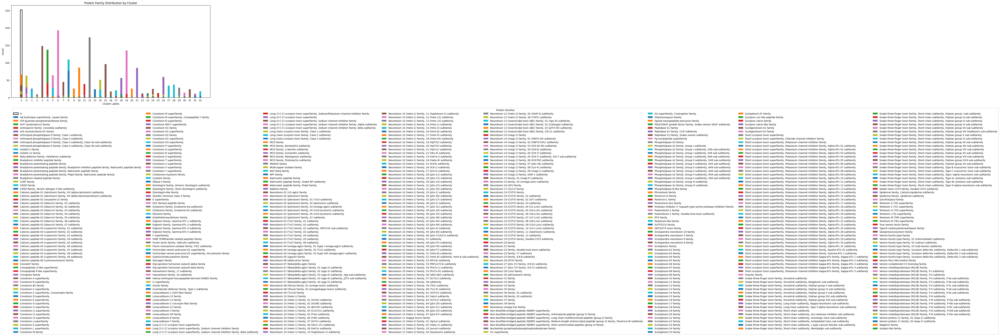

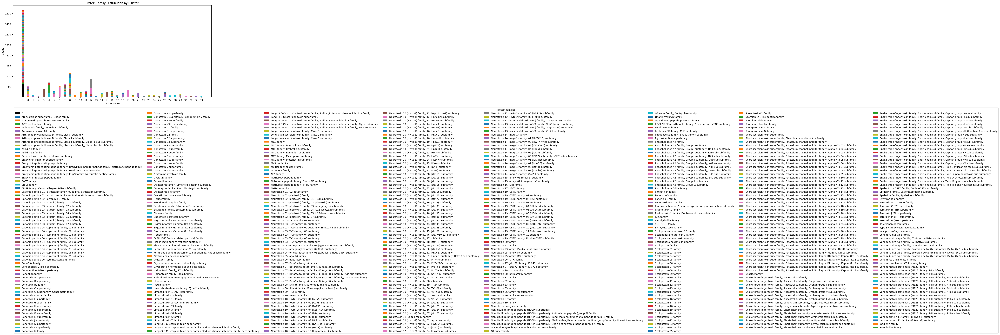

In [22]:
# Plot protein_family distribution
plot_cluster_contents(grouped, 'Protein families', 'Protein Family Distribution by Cluster', 'cluster_labels', None)
plot_stacked_cluster_contents(grouped, 'Protein families', 'Protein Family Distribution by Cluster', 'cluster_labels', None)

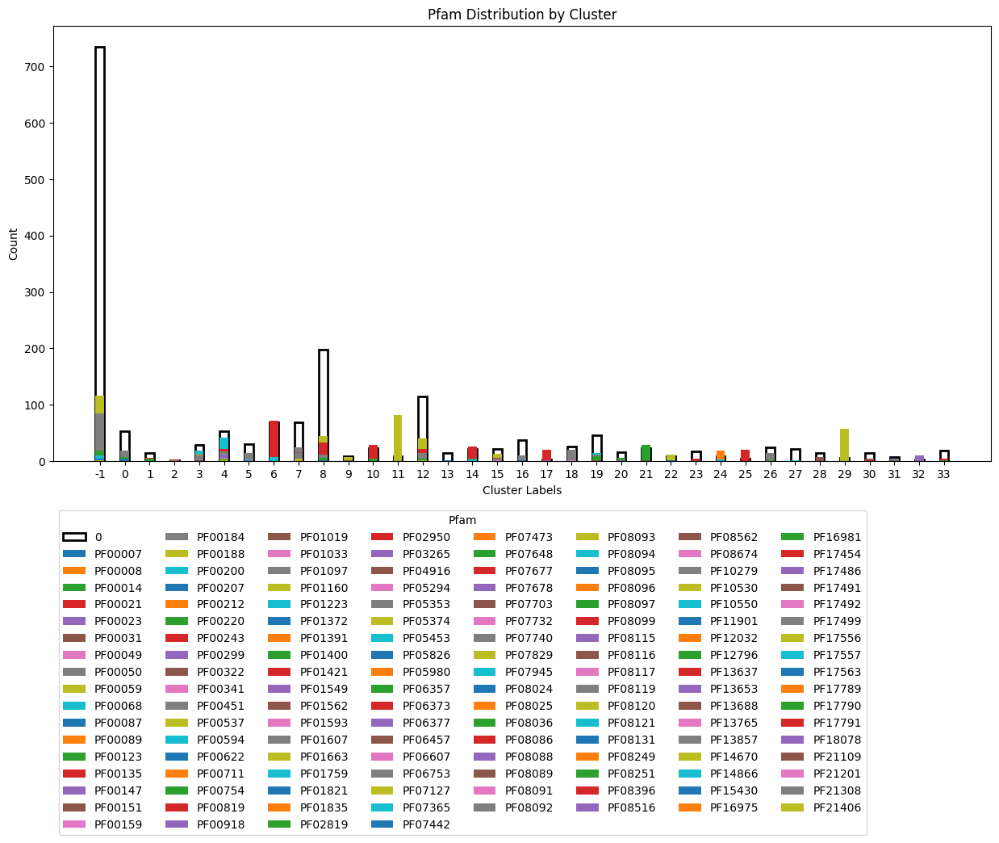

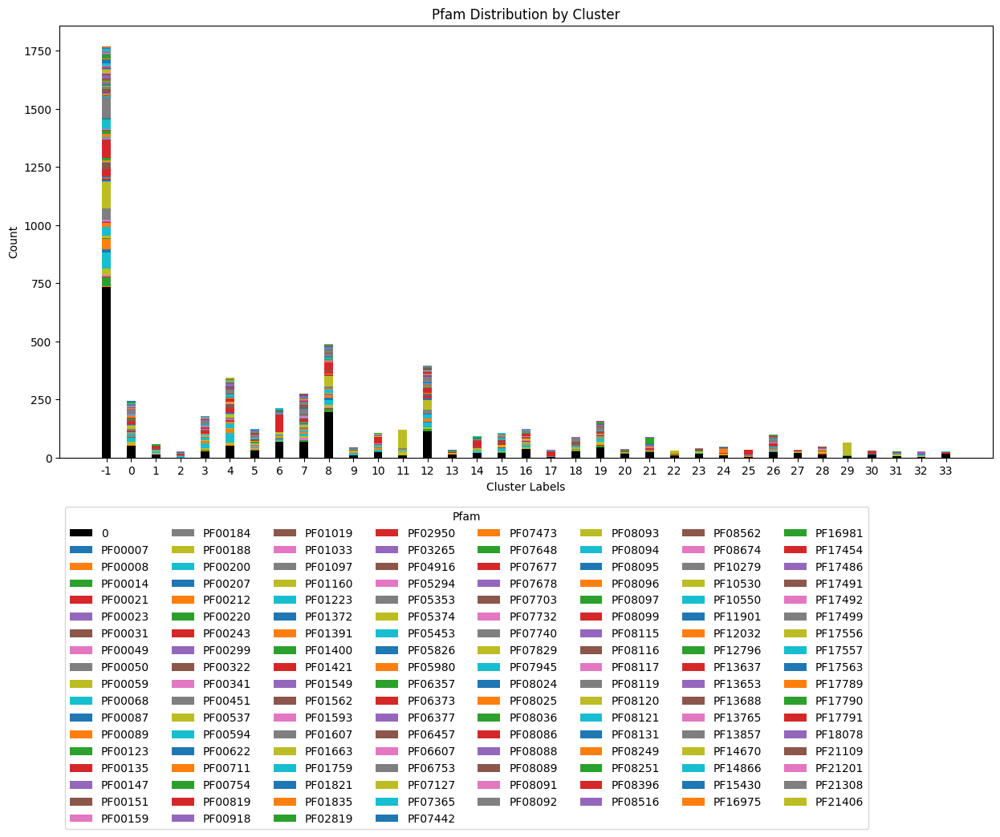

In [23]:
# Plot pfam distribution
plot_cluster_contents(grouped, 'Pfam', 'Pfam Distribution by Cluster', 'cluster_labels', None)
plot_stacked_cluster_contents(grouped, 'Pfam', 'Pfam Distribution by Cluster', 'cluster_labels', None)

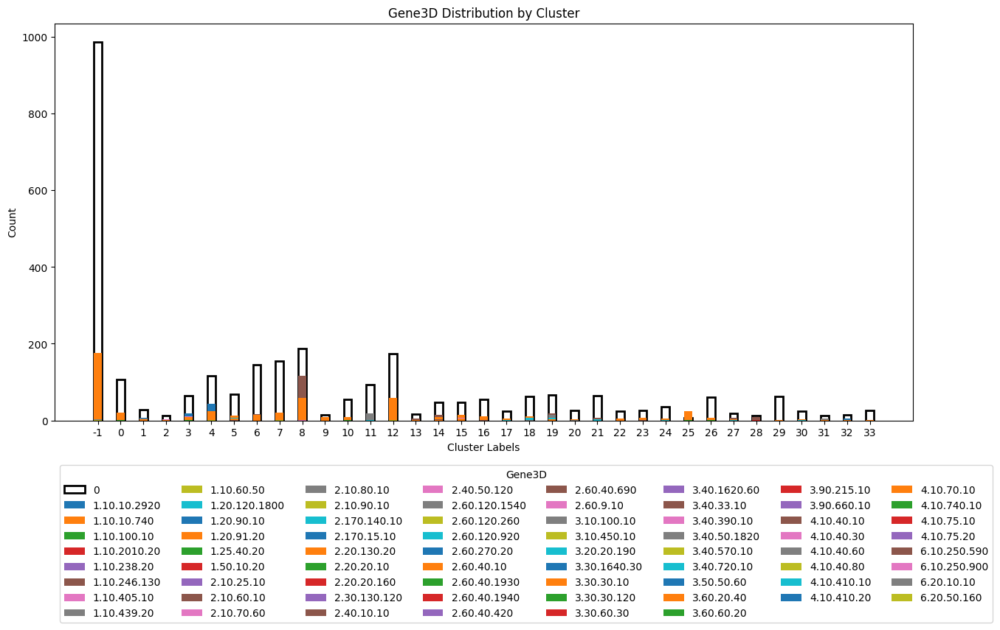

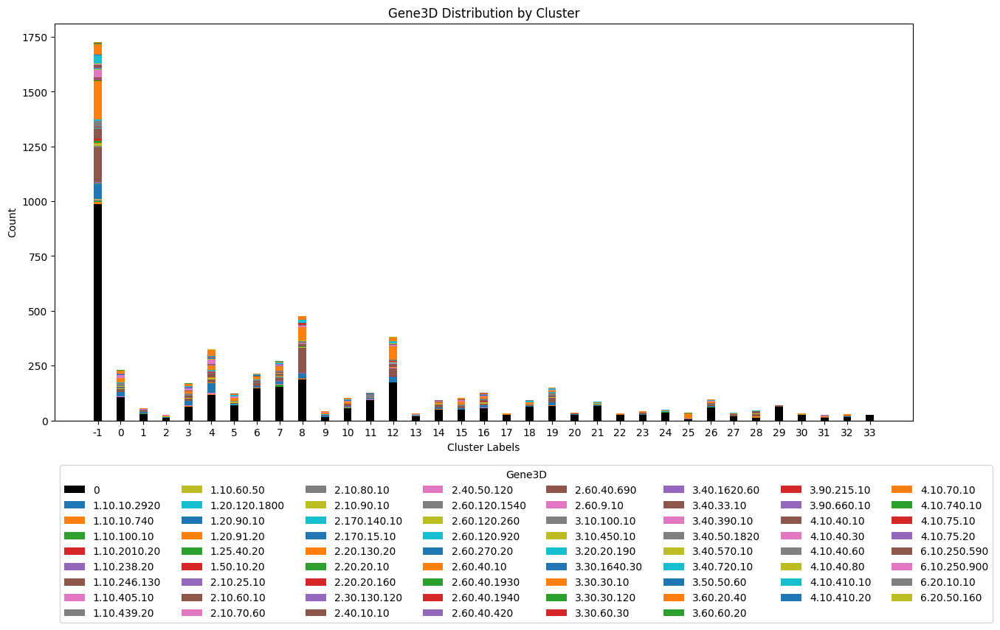

In [24]:
# Plot Gene3D distribution
plot_cluster_contents(grouped, 'Gene3D', 'Gene3D Distribution by Cluster', 'cluster_labels', None)
plot_stacked_cluster_contents(grouped, 'Gene3D', 'Gene3D Distribution by Cluster', 'cluster_labels', None)

cluster_labels
 31      26
 2       26
 33      27
 32      28
 13      29
 22      31
 30      32
 25      32
 17      33
 27      34
 20      36
 28      38
 9       40
 23      42
 24      48
 1       51
 29      67
 14      86
 21      86
 18      91
 26      93
 10      96
 15      96
 16     116
 5      116
 11     122
 19     145
 3      150
 6      206
 0      209
 7      255
 4      280
 12     354
 8      463
-1     1671
Name: count, dtype: int64

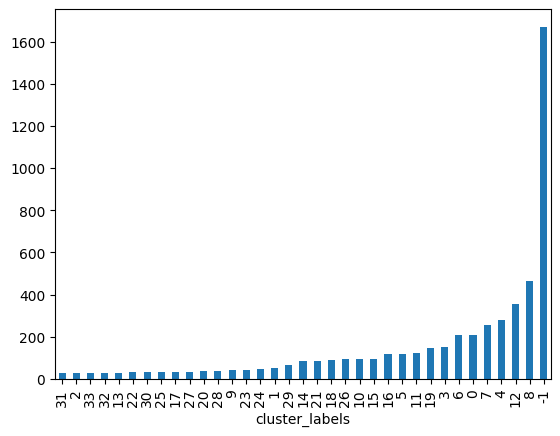

In [25]:
# protein counts of each cluster 
val_counts = data['cluster_labels'].value_counts().sort_values()
val_counts.plot(kind='bar')
val_counts

In [26]:
data

,Entry,Entry Name,Protein names,Gene Names,Organism,Domain [FT],Protein families,Sequence similarities,Sequence,X,Y,cluster_labels,Pfam,Gene3D
0,A0A0B4U9L8,VMF1_VIPAA,Zinc metalloproteinase-disintegrin-like protei...,0,Vipera ammodytes ammodytes (Western sand viper),"DOMAIN 202..398; /note=""Peptidase M12B""; /evid...","Venom metalloproteinase (M12B) family, P-III s...",SIMILARITY: Belongs to the venom metalloprotei...,MLQVLLVTICLAVFPYQGSSIILESGNVNDYEVVYPQKLTALLKGA...,0.215006,0.719284,0,PF08516;PF00200;PF01562;PF01421;,3.40.390.10;4.10.70.10;
1,A0A0B5A8P4,INS3A_CONGE,Con-Ins G3 (Insulin 3) [Cleaved into: Con-Ins ...,0,Conus geographus (Geography cone) (Nubecula ge...,0,Insulin family,SIMILARITY: Belongs to the insulin family.,MTTSFYFLLVALGLLLYVCQSSFGNQHTRNSDTPKHRCGSELADQY...,0.471781,0.804368,1,PF00049;,1.10.100.10;
2,A0A0B5AC95,INS1A_CONGE,Con-Ins G1a (Insulin 1) [Cleaved into: Con-Ins...,0,Conus geographus (Geography cone) (Nubecula ge...,0,Insulin family,SIMILARITY: Belongs to the insulin family. {EC...,MTTSSYFLLMALGLLLYVCQSSFGNQHTRTFDTPKHRCGSEITNSY...,0.471446,0.809471,1,PF00049;,1.10.100.10;
3,A0A0D4WV12,BIB11_SICTE,Dermonecrotic toxin StSicTox-betaIB1i (EC 4.6....,0,Sicarius terrosus (Cave spider),0,"Arthropod phospholipase D family, Class II sub...",SIMILARITY: Belongs to the arthropod phospholi...,GDSRRPIWNIAHMVNDLDLVDEYLDDGANSLELDVEFSKSGTALRT...,0.082629,0.644929,2,PF13653;,3.20.20.190;
4,A0A0N7CSQ4,TX41A_SCOMU,Tau-scoloptoxin(04)-Sm1b (Tau-SLPTX(04)-Sm1b) ...,0,Scolopendra mutilans (Chinese red-headed centi...,0,Scoloptoxin-04 family,SIMILARITY: Belongs to the scoloptoxin-04 fami...,MLKSFCILSVFMVLFLAKFPDLCSGEEISPLKIVVRNSEYLNNPCN...,0.123150,0.701138,-1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5250,P0CI16,TE61_HASHE,Augerpeptide hhe6.1,0,Hastula hectica (Sea snail) (Impages hectica),0,0,0,GMGIGINLPPCIKNGEYCNPWTGSIILGGACCGTCTDYECH,0.945380,0.453934,-1,0,0
5251,P0CI17,TE62_HASHE,Augerpeptide hhe6.2,0,Hastula hectica (Sea snail) (Impages hectica),0,0,0,ALPCPYGCPLRCCHMTDGVCLRNKQGC,0.422708,0.038988,-1,0,0
5252,P0CI18,TE63_HASHE,Augerpeptide hhe6.3,0,Hastula hectica (Sea snail) (Impages hectica),0,0,0,VLFTPPELLGCGNRCSDDCCKWGRCQPGCTD,0.003607,0.602928,-1,0,0
5253,P0CI19,TE64_HASHE,Augerpeptide hhe6.4,0,Hastula hectica (Sea snail) (Impages hectica),0,0,0,SSLHCGDDPWCPTGCCENEDCDIGCKRDWEKSRSQP,0.048968,0.425110,-1,0,0


In [27]:
def plot_single_cluster_contents(cluster_df, cluster_label, column_name, title):
    counts = cluster_df.loc[cluster_df['cluster_labels'] == cluster_label, column_name + '_counts'].values[0]
    
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.barh(list(counts.keys()), list(counts.values()))
    
    # calculating the protein counts and averaged col values in each cluster
    cluster_prot_count = (data['cluster_labels'] == cluster_label).sum()
    unique_labels = data.loc[data['cluster_labels'] == cluster_label, column_name].nunique()
    col_label_count = data[(data['cluster_labels'] == cluster_label) & (data[column_name] != '0')].value_counts().sum()
        
    ax.set_title(f'{title}\n'
                 f'protein count: {cluster_prot_count}, unique {column_name} count: {unique_labels}\n'
                 f'#{column_name} without nan/#proteins: {round((col_label_count/cluster_prot_count),4)} \n'
                 f'#distinct {column_name}/#proteins: {round((unique_labels/cluster_prot_count),4)}')
    ax.set_xlabel('Count')
    ax.set_ylabel(column_name.capitalize())
    
    plt.savefig(f'out/{column_name}/{column_name}_{cluster_label}.png', dpi=250, bbox_inches='tight')
    plt.show()

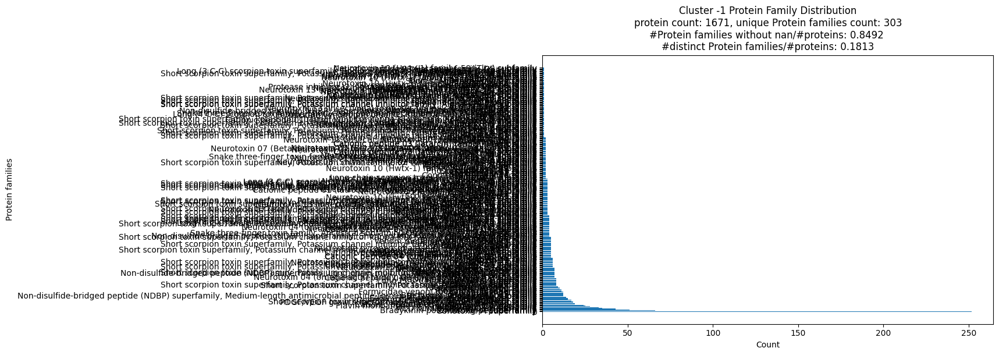

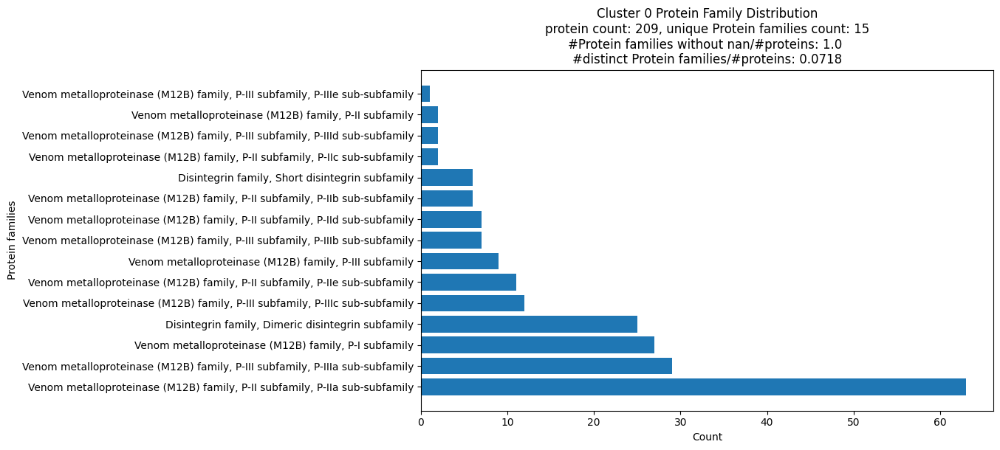

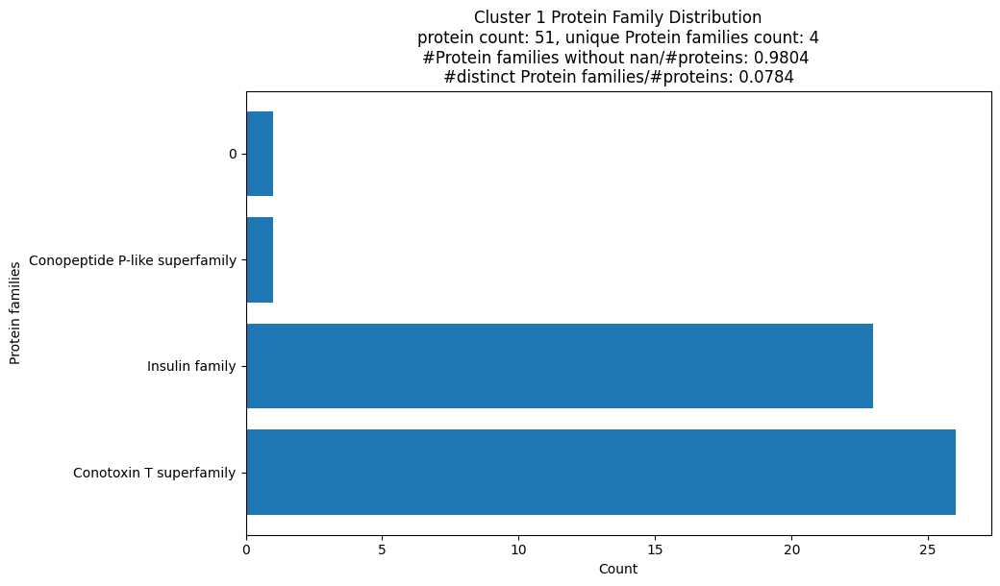

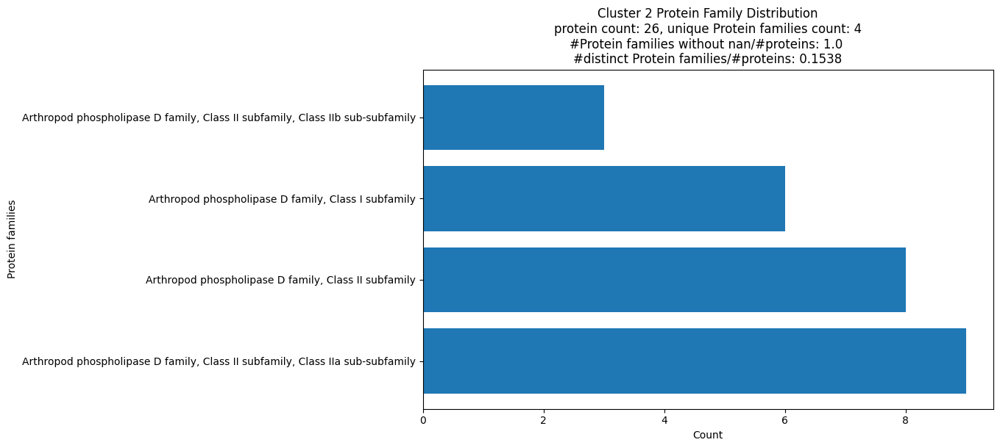

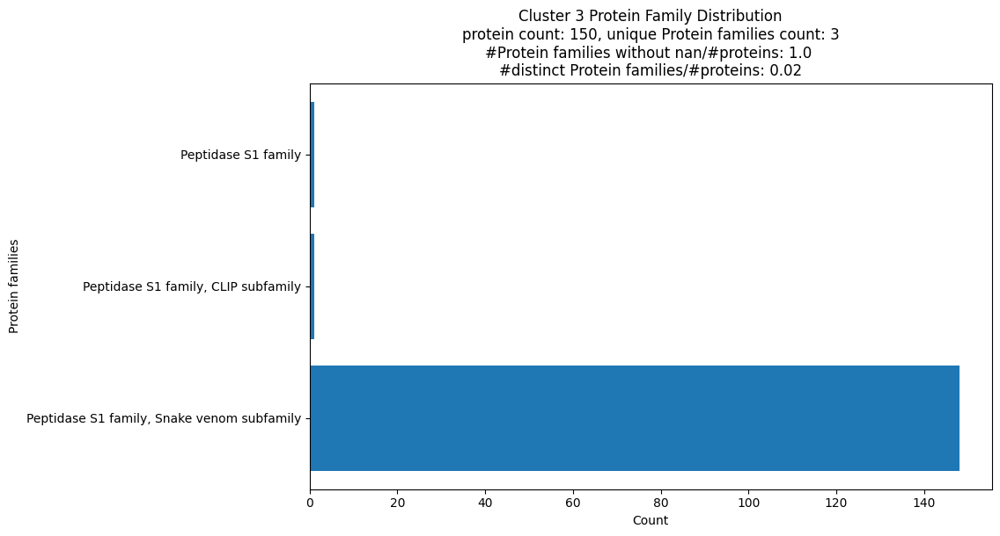

...

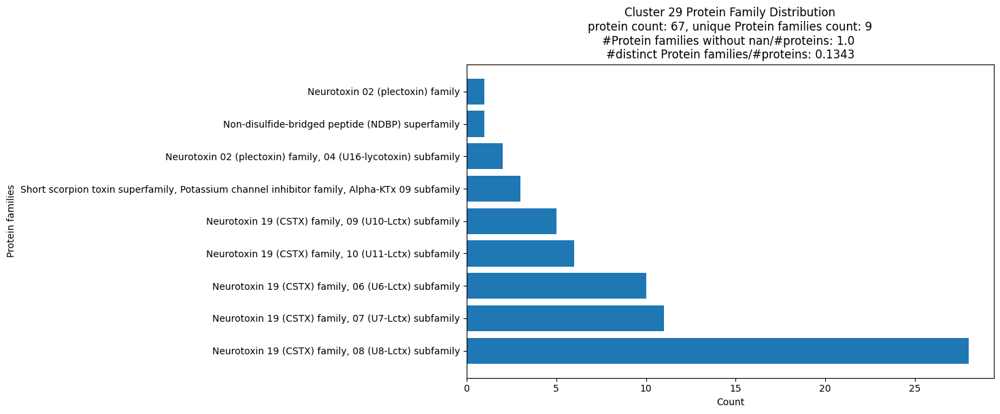

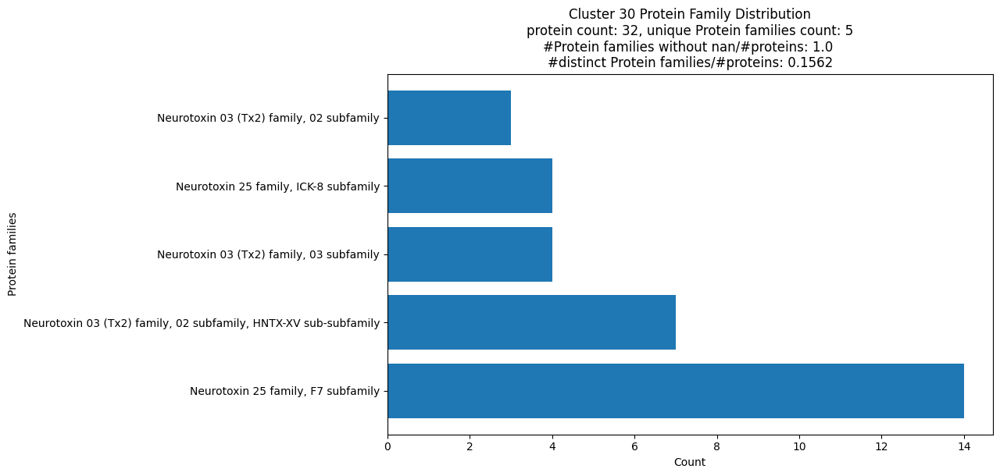

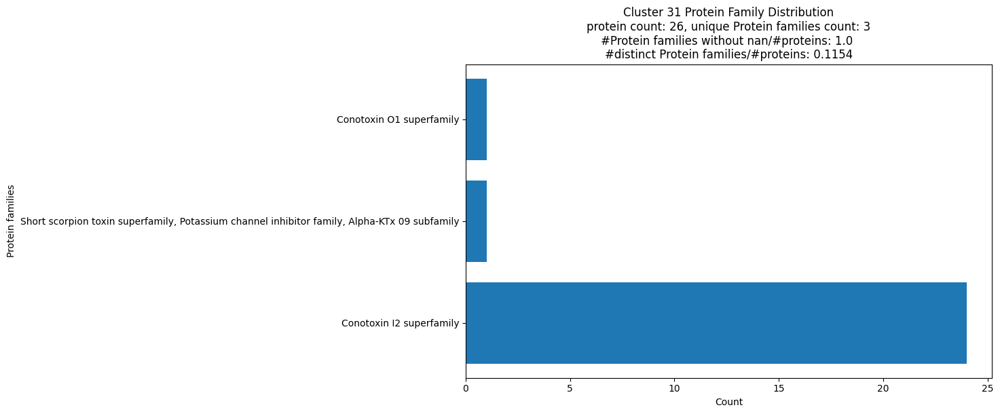

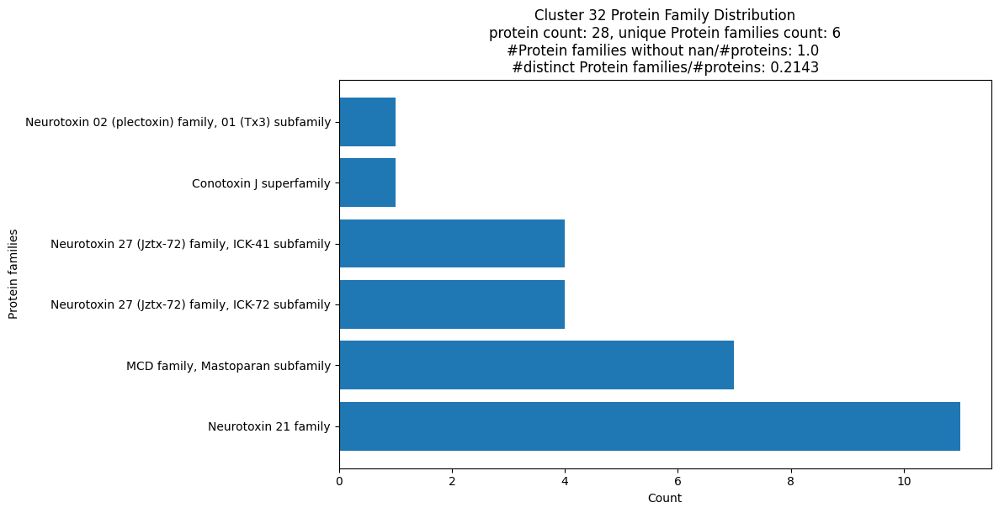

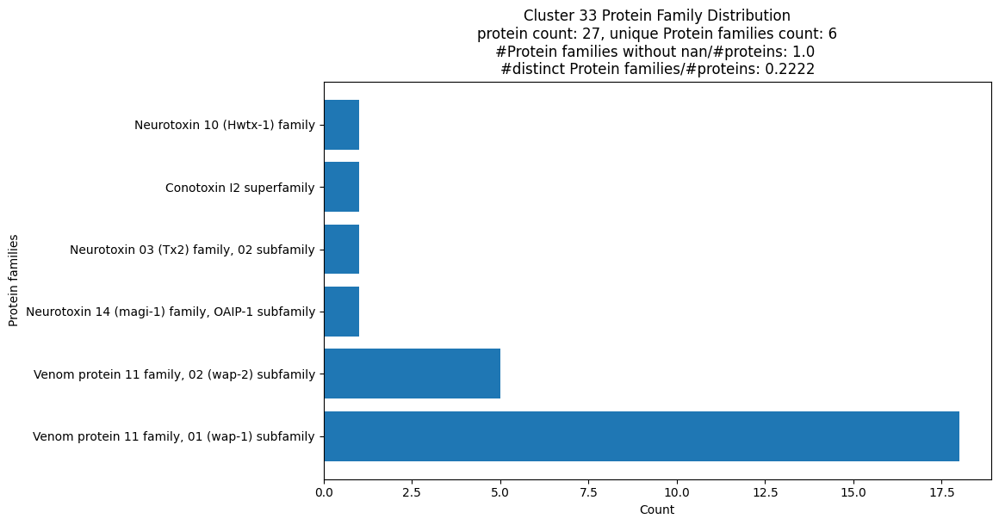

In [28]:
for cluster in grouped['cluster_labels']:
    #print(cluster)
    plot_single_cluster_contents(grouped, cluster, "Protein families", f"Cluster {cluster} Protein Family Distribution")

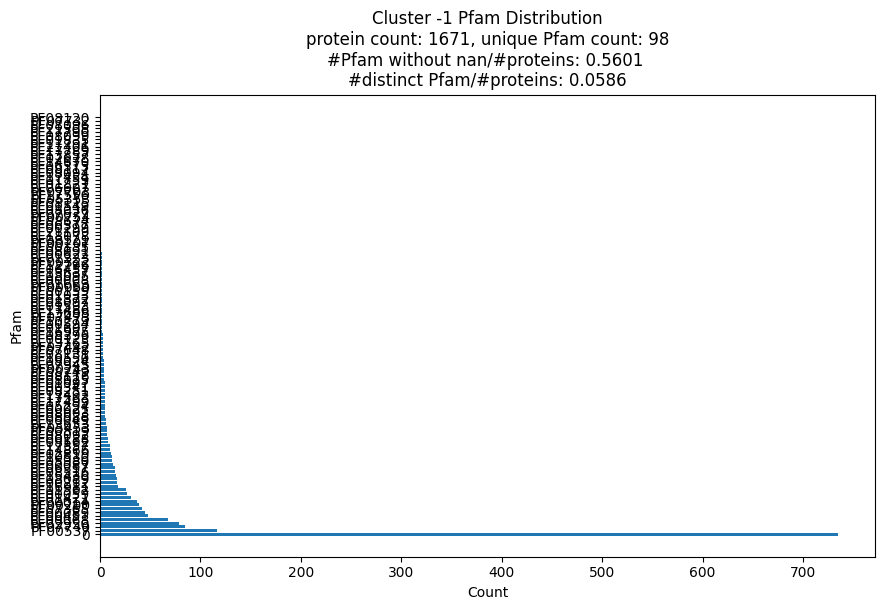

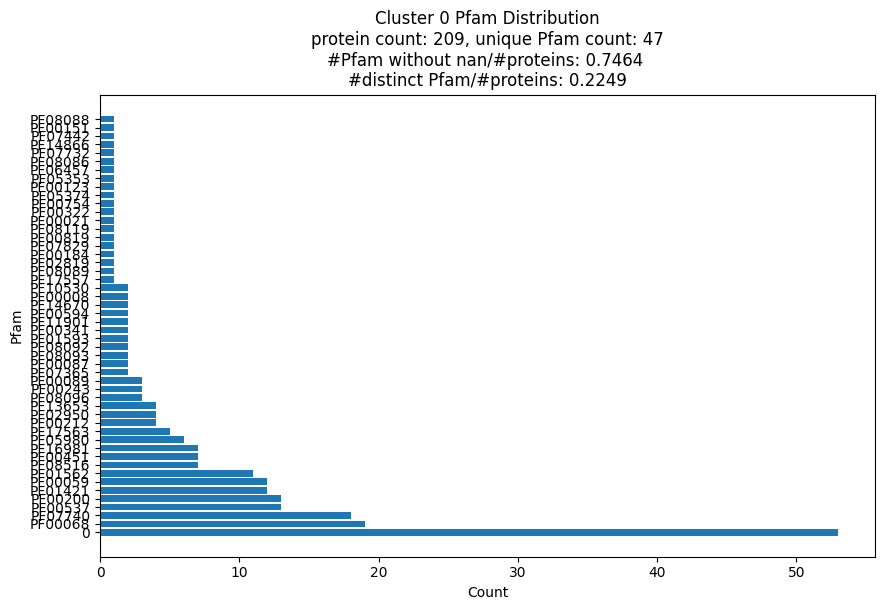

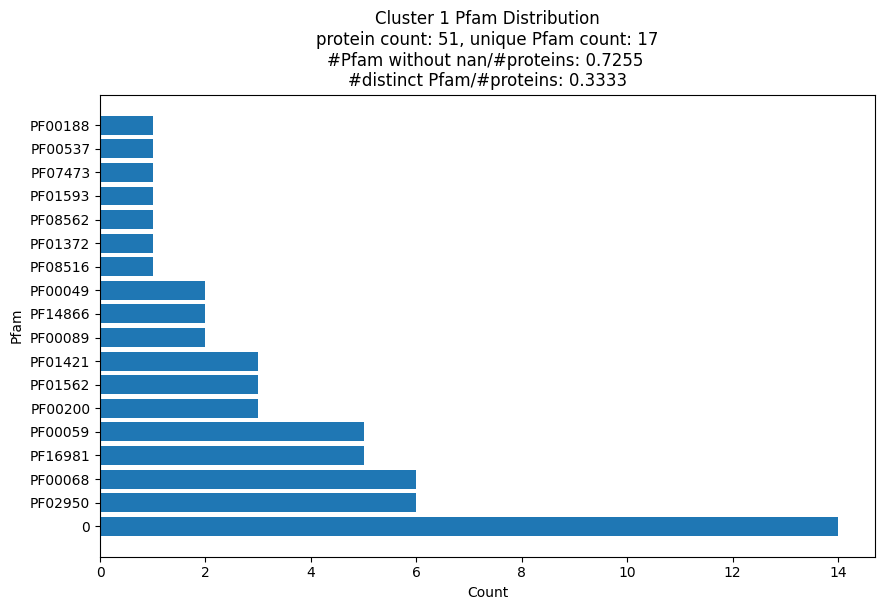

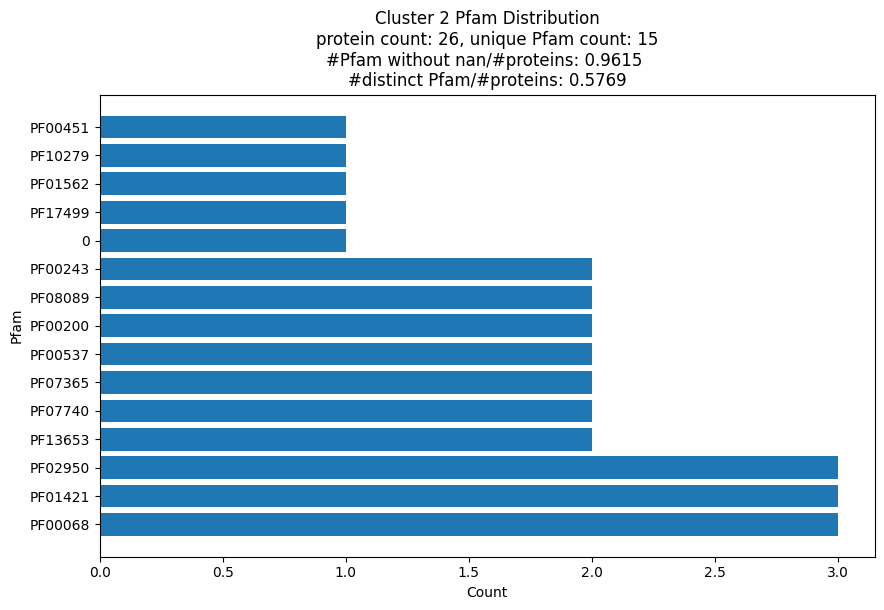

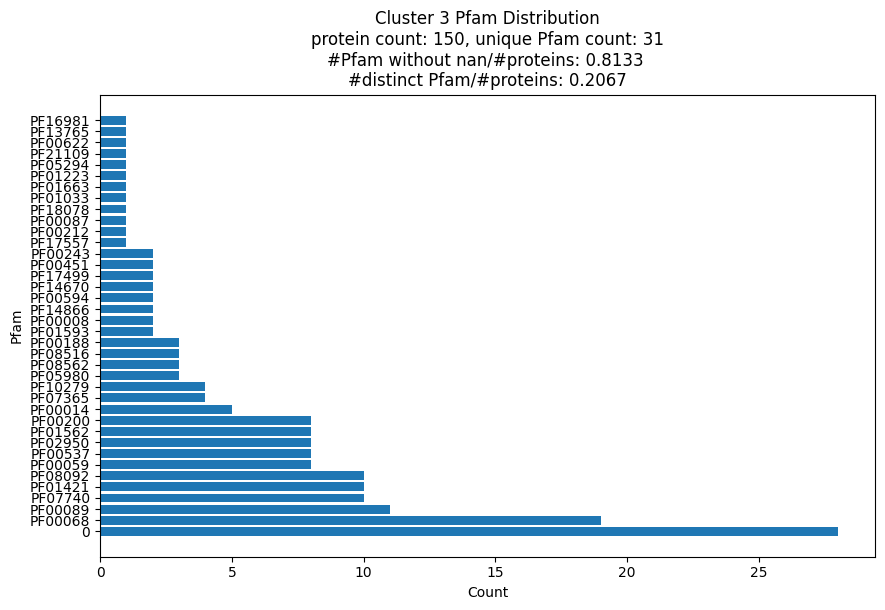

...

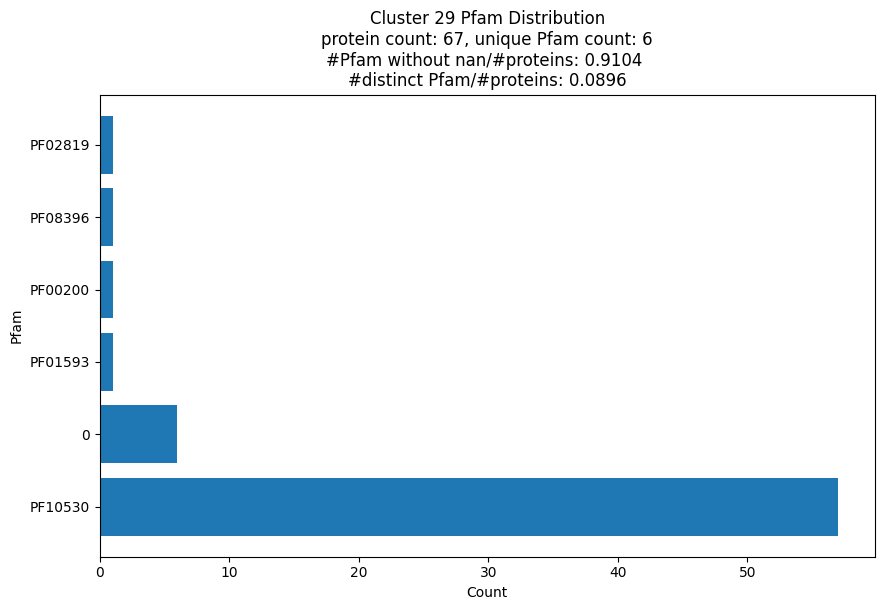

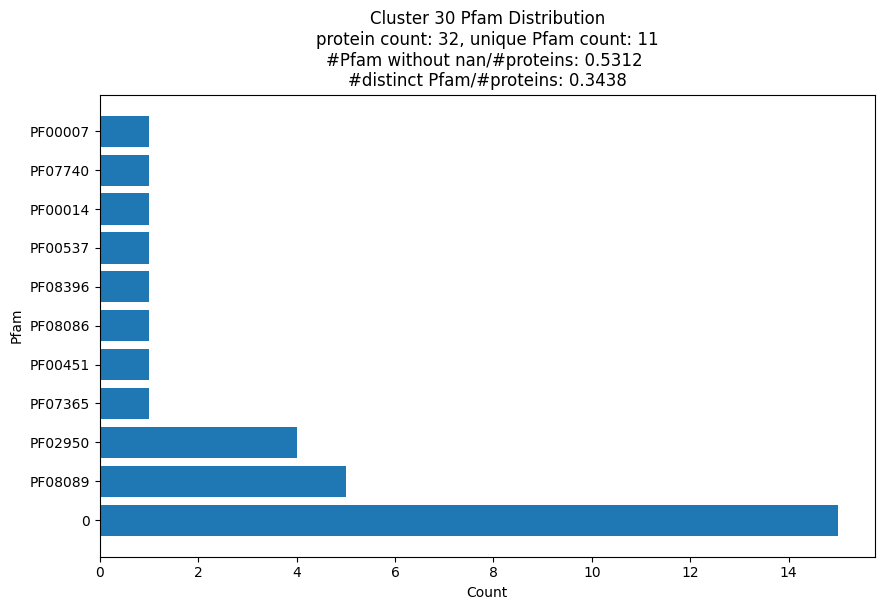

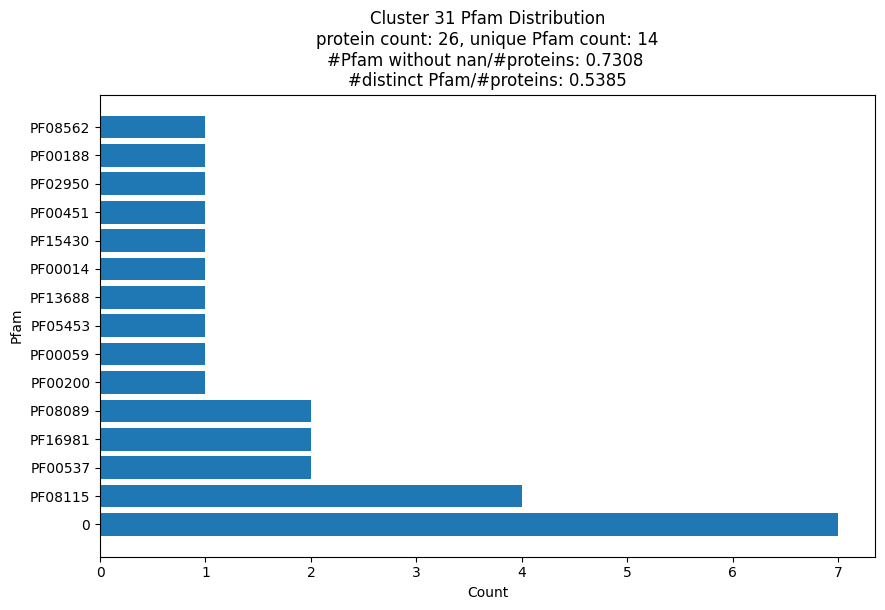

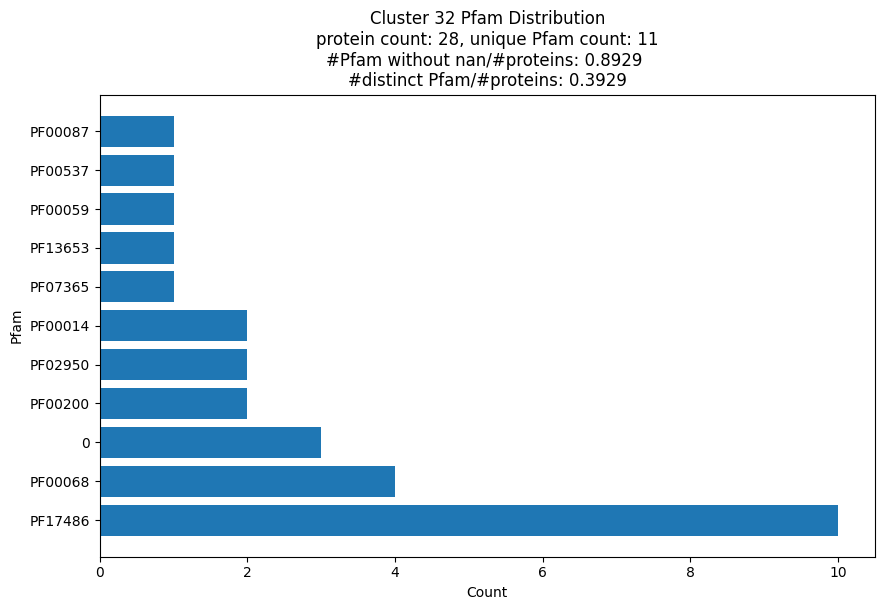

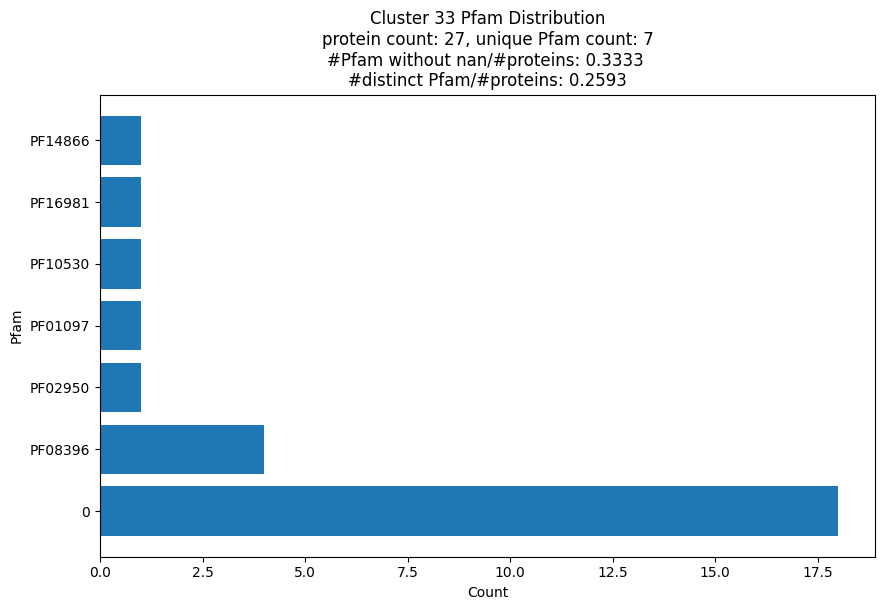

In [29]:
for cluster in grouped['cluster_labels']:
    plot_single_cluster_contents(grouped, cluster, "Pfam", f"Cluster {cluster} Pfam Distribution")

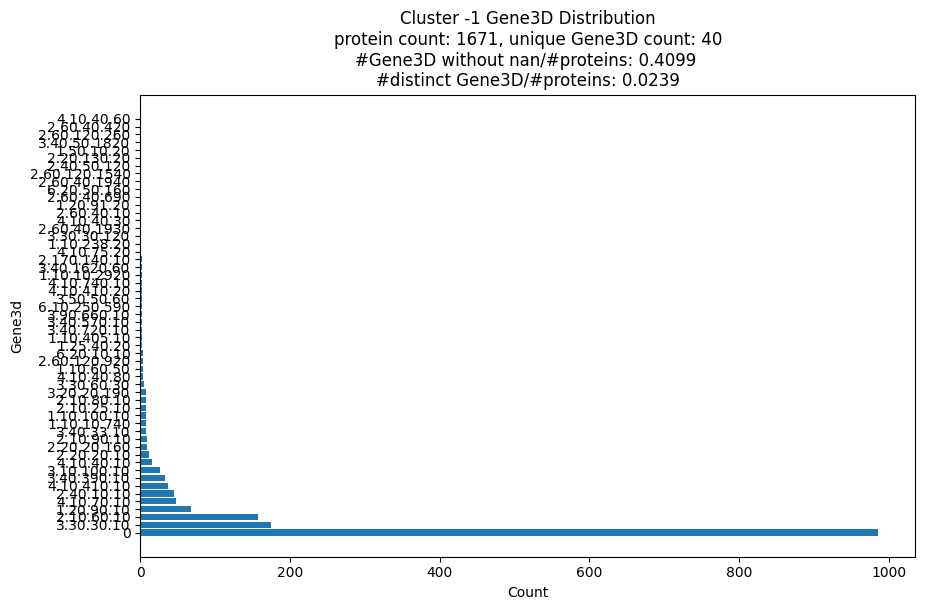

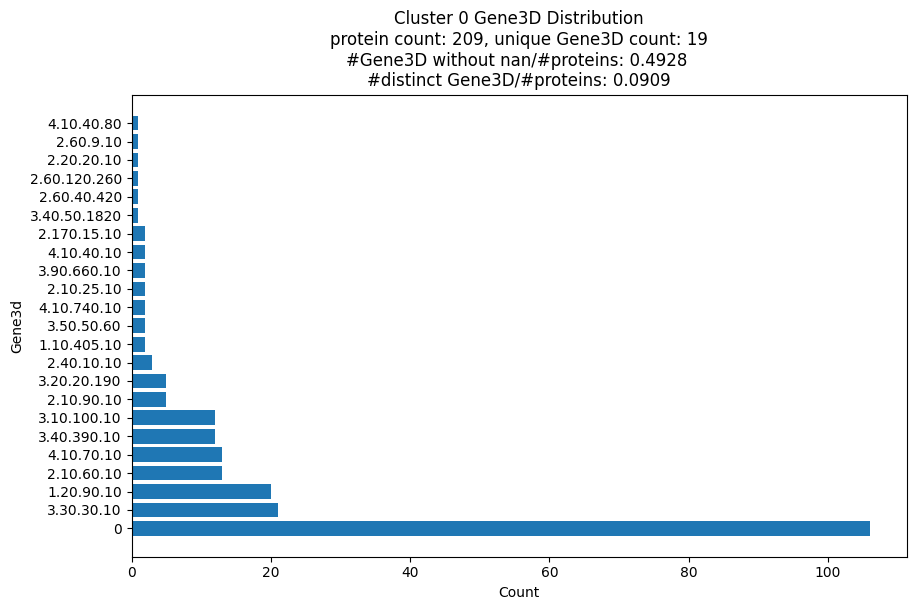

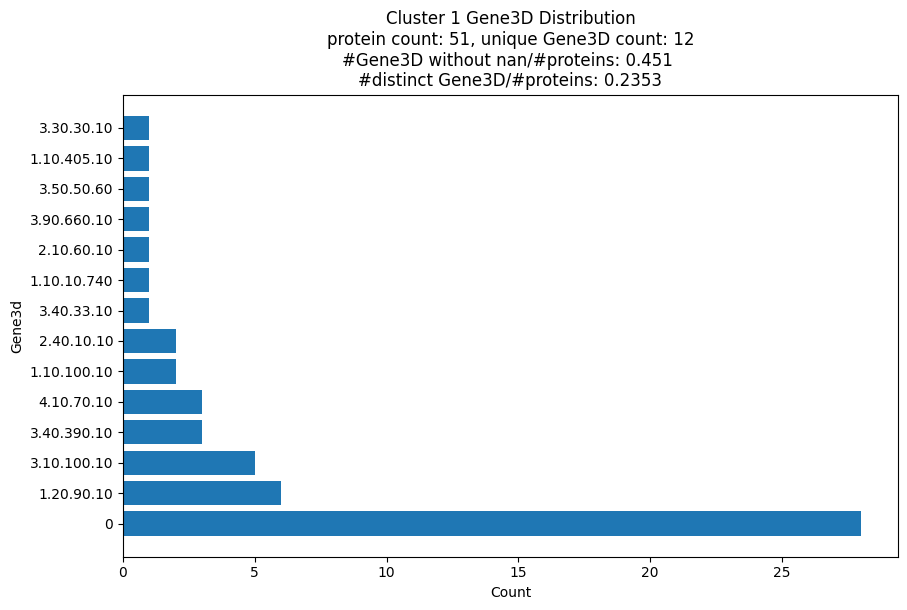

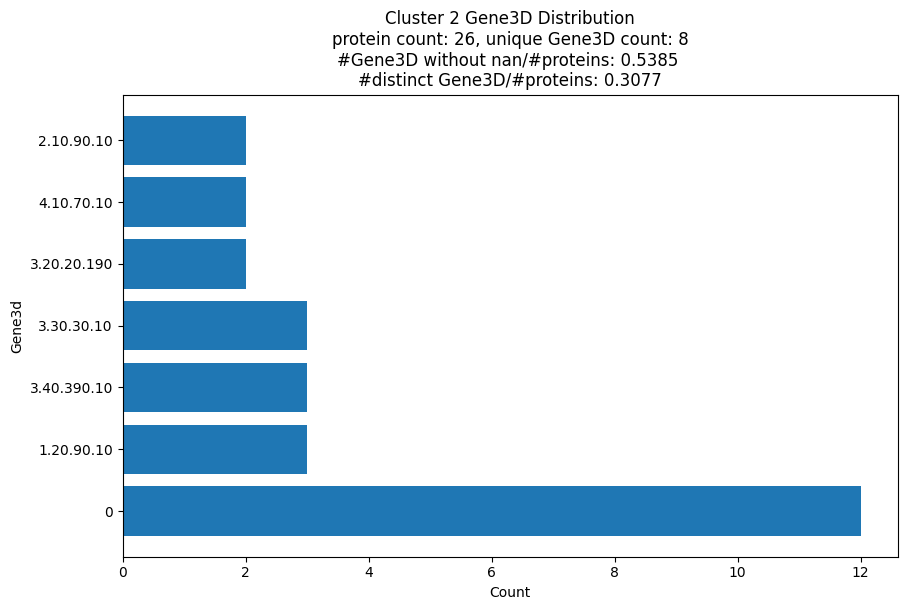

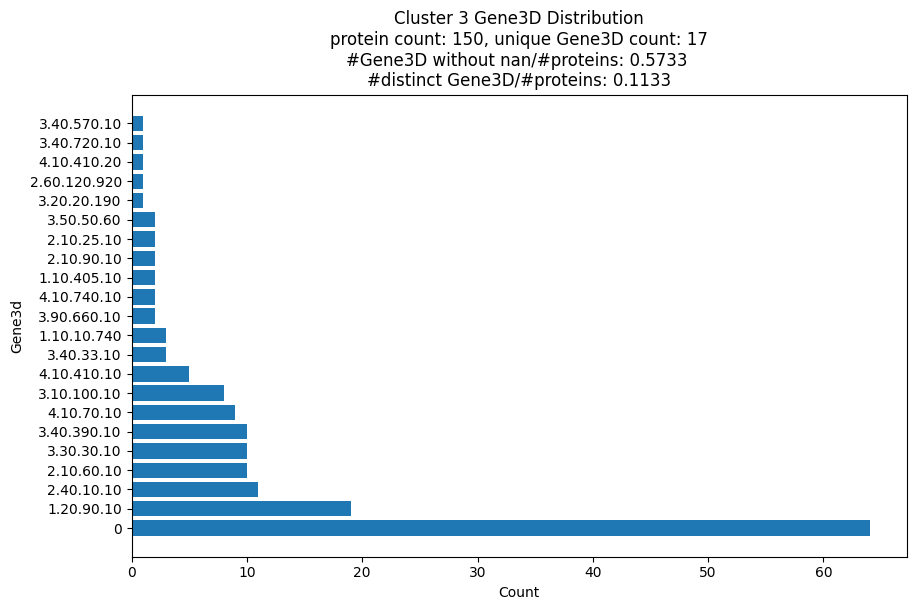

...

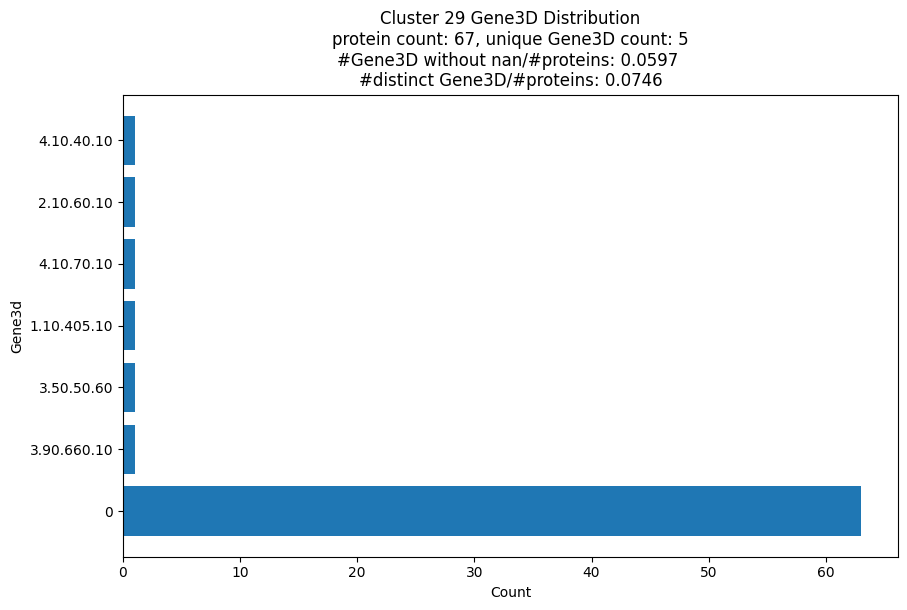

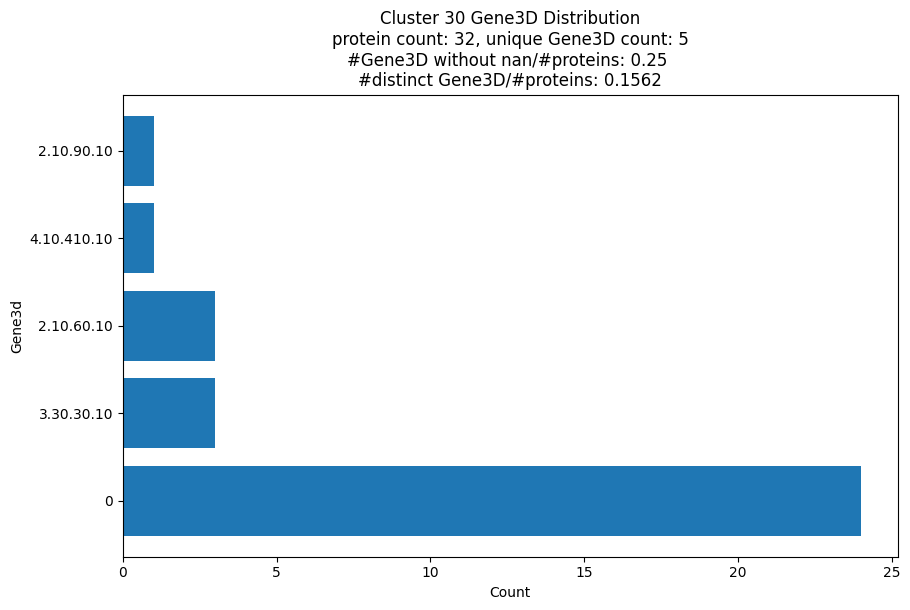

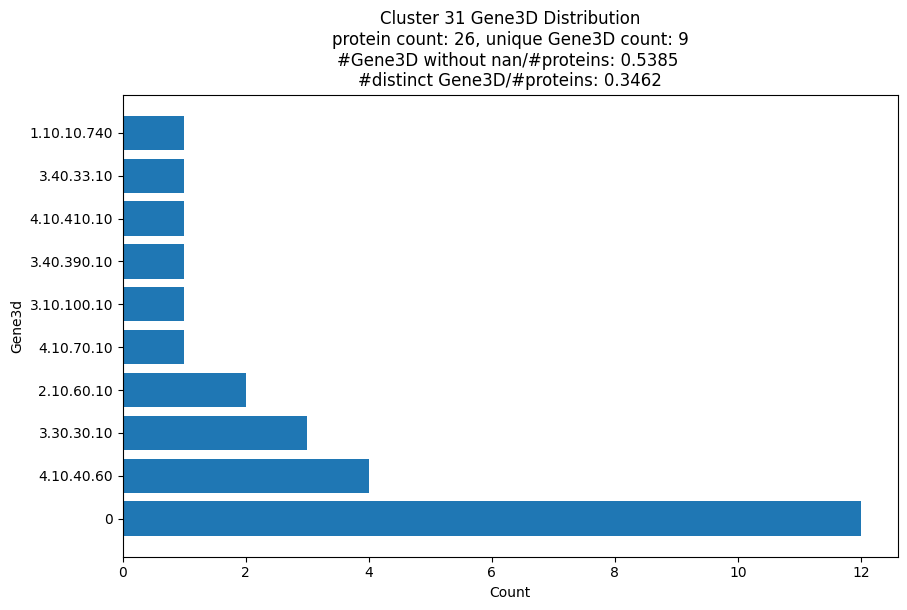

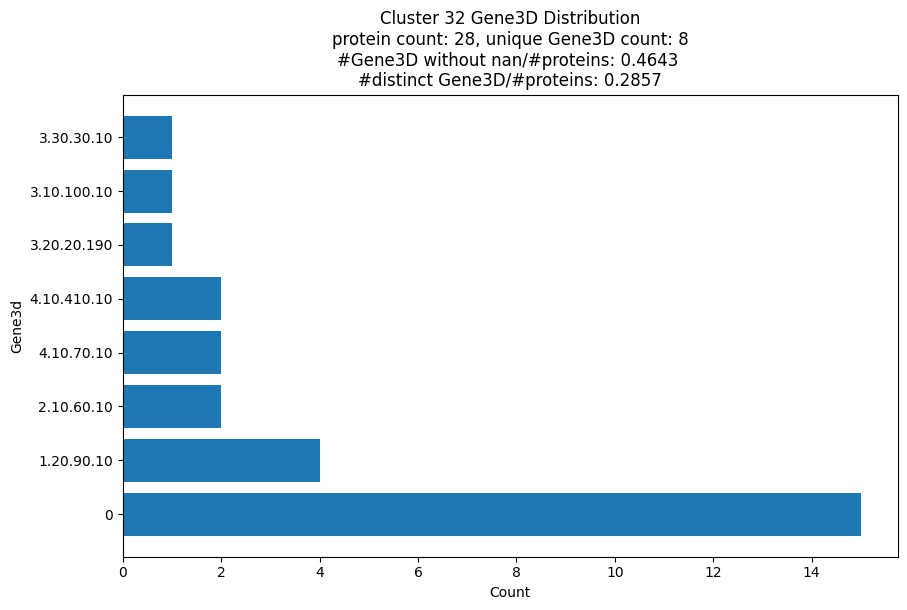

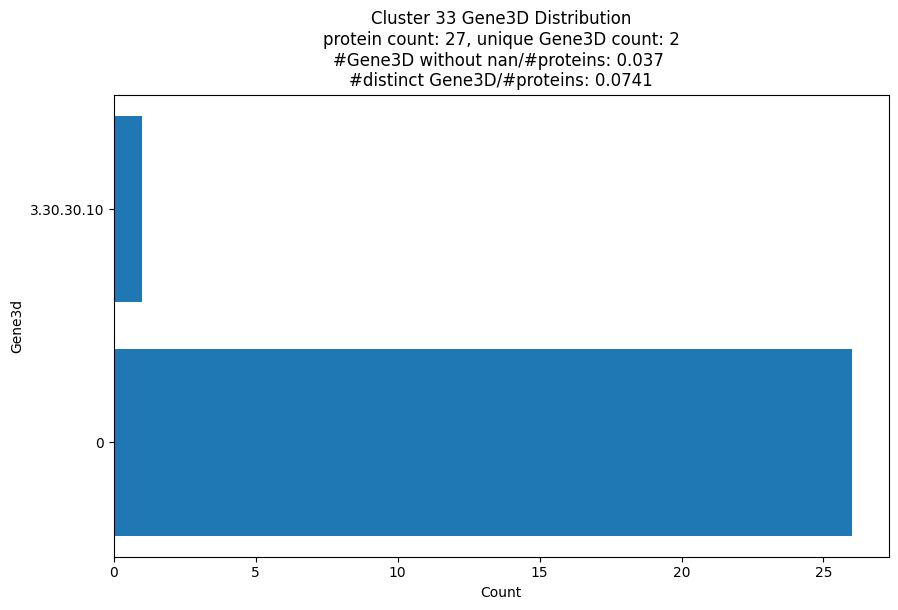

In [30]:
for cluster in grouped['cluster_labels']:
    plot_single_cluster_contents(grouped, cluster, "Gene3D", f"Cluster {cluster} Gene3D Distribution")

In [31]:
data['Gene3D'].value_counts()

Gene3D
0                                                                                                                            2940
3.30.30.10;                                                                                                                   536
2.10.60.10;                                                                                                                   483
1.20.90.10;                                                                                                                   290
3.10.100.10;                                                                                                                  145
2.40.10.10;                                                                                                                   138
4.10.410.10;                                                                                                                  114
3.40.390.10;4.10.70.10;                                                            

In [32]:
df_sorted = data.sort_values(by='cluster_labels', ascending=True)  # Use ascending=False for descending order
# not needed anymore
#df_sorted.to_excel('out/data/5255_toxins.xlsx')